In [285]:
import numpy as np
import copy
import pickle

from scipy import ndimage
from BaselineRemoval import BaselineRemoval
import matplotlib.pyplot as plt
import os
from scipy import interpolate

plt.rcParams['figure.figsize'] = (20.0, 10.0)
# plt.rcParams['figure.figsize'] = (10.0, 5.0)
plt.rcParams['figure.dpi'] = 500

Mogelijke verbeteringen:
 - maak de covariance afhankelijke van de noise 
 - draai de spectrum zodanig dat de globale sloop de x-as is. Zodat het min-max algorithme beter werkt.
 - de smoothing die applied wordt door de covariantie moet afgesteld worden per sample

Problemen:
 - initializatie maakt uit voor de kalman smoother (hoeveel noise er is vs raman)
 - aantal iteratie maakt uit voor de kalman smoother (hoeveel noise er is vs raman)
 - de bounderies hebben geen invloed op de kalman smoother buiten alles binnen de bounderies houden.
   Tenzij smoothing ook aanstaat.
   
   
excitation laser maakt uit hoe de raman laser eruit ziet. Hoger (rood) betekend lower raman signal en een breder signal

In [320]:
file_location = "../data/Raman_Mouse/corrected_4_wavenumbers/"
# file_location = "../data/Green_excitation/corrected_4_wavenumbers/"

filenames = np.load(f"{file_location}FileNames.npy")
with open(f"{'/'.join(file_location.split('/')[:-2])}/Sample_labels.pickle", 'rb') as f:
    labels = pickle.load(f)
labels = {l.split(".")[0]: val for l, val in labels.items()}

wavenumbers = np.load(f"{file_location}Wavenumbers.npy")
    
data = []
for f in filenames:
    x = np.load(f"{file_location}{f.split('.')[0]}.npy")
    data.append(((x.reshape(-1,x.shape[-1])).reshape(x.shape), labels[f.split(".")[0]]))

In [379]:
rng = np.random.default_rng()
KALMAN_SMOOTHING = True
KALMAN_BOUNDARIES = True

class Kalman():    
    def __init__(self, X, grad, raman_grad, e, neighbourhood, photo_smoothness = 500, noise_smoothness = 2, correct_photo_appr_blacknoise=True):
        """
        noise_smoothness controls the amount of noise when set below zero, raman data will be seen as noise.
        high noise_smoothness means low noise (however a low number does not remove noise correctly)
        """
        
        self.X = X
        self.N_wavenumbers = self.X.shape[0]
        self.N_photo_appr = X.shape[1] - 1
        self.photo_smoothness = photo_smoothness
        self.noise_smoothness = noise_smoothness
        
        self.C = np.array([[1,1]] +
                           [[1,0]] * self.N_photo_appr)
        self.A = np.zeros((self.N_wavenumbers, 2, 2))
        self.A[:,0,0] = grad
        self.A[:,1,1] = raman_grad
#         self.A[:,1,1] = 1
        
        if correct_photo_appr_blacknoise:
            self.e = np.array([e] * X.shape[1])
        else:
            self.e = np.array([e] + [0] * self.N_photo_appr)
            
        self.n = neighbourhood
        self.mu = np.empty((self.N_wavenumbers, 2))
        self.M = np.empty((self.N_wavenumbers, 2, 2))
        self.nu = np.empty((self.N_wavenumbers+1, 2))
        self.V = np.empty((self.N_wavenumbers+1, 2, 2))
        self.J = np.empty((self.N_wavenumbers, 2, 2))

        self.nu[0] = [X[0,0], 0]
        
#         self.Sigma = np.diag(rng.standard_normal(1 + self.N_photo_appr))
#         self.Gamma = np.diag(rng.standard_normal(2))
#         self.V[0] = [[np.random.random(), 0],
#                      [0, np.random.random()]]
        self.Sigma = np.array([[5, 1], [1, 1]])
        self.Gamma = np.array([[1, 0], [0, 10]])
        self.V[0] = np.array([[1, 0], [0, 10]])
        
    @property
    def raw_data(self):
        return self.X, self.A[:,0,0]
    
    @raw_data.setter
    def raw_data(self, args):
        value, grad, raman_grad, *_ = args + [np.ones(self.X.shape)]
        self.X = value
        self.nu[0] = [self.X[0,0], 0]
        self.A[:,0,0] = grad
        self.A[:,1,1] = raman_grad
        self.EM(1)
        
    def _filter_step(self, i):
        CV = self.C @ self.V[i]
        b = self.C @ self.nu[i] + self.e
        B = CV @ self.C.T + self.Sigma
        K = self.V[i] @ self.C.T @ np.linalg.inv(B)
        self.mu[i] = self.nu[i] + K @ (self.X[i] - b)
        self.M[i] = self.V[i] - K @ CV

        # transition
        self.nu[i+1] = self.A[i] @ self.mu[i]
        self.V[i+1] = self.A[i] @ self.M[i] @ self.A[i] + self.Gamma # A = A.T
        self.b=b
        
        if KALMAN_BOUNDARIES:
            self.nu[i+1,0] = min(min(self.X[max(0,i-self.n):min(self.N_wavenumbers,i+self.n)+1,0]) - self.e[0], self.nu[i+1,0])
            self.nu[i+1,1] = max(0, self.nu[i+1,1])
        

    def _smoother_step(self, i):
        if KALMAN_BOUNDARIES:
            self.mu[i,0] = min(min(self.X[max(0,i-self.n):min(self.N_wavenumbers,i+self.n)+1,0]) - self.e[0], self.mu[i,0])
            self.mu[i,1] = max(0, self.mu[i,1])
        self.J[i] = self.M[i-1] @ self.A[i] @ np.linalg.inv(self.V[i])
        self.M[i-1] += self.J[i] @ (self.M[i] - self.V[i]) @ self.J[i].T
        self.mu[i-1] += self.J[i] @ (self.mu[i] - self.nu[i])
    
    def kalman_filter(self):
        self.tmp = []
        for i in range(len(self.X)):
            self._filter_step(i)
            self.tmp.append(self.b)
        self.tmp = np.array(self.tmp)
 
    def kalman_smoother(self):
        self.kalman_filter()
        for i in range(len(self.X)-1, -1, -1):
            self._smoother_step(i)
            
    def EM(self, n):
        for i in range(n):
            self.kalman_smoother()
            E_z = self.mu
            E_zz = self.M + self.mu.reshape(-1,self.mu.shape[1],1) @ self.mu.reshape(-1,1,self.mu.shape[1])
            E_z_1z = (self.J @ self.M)[1:] + self.mu[:-1].reshape(-1,self.mu.shape[1],1) @ self.mu[1:].reshape(-1,1,self.mu.shape[1])
            
            self.nu[0] = np.maximum(np.zeros(2), E_z[0])
            self.V[0] = self.V[2]
            
            # skip nu_0, V_0, A and C
            self.Gamma = np.sum(E_zz[1:] - 
                                E_z_1z.transpose(0,2,1) @ self.A[:-1].transpose(0,2,1) - 
                                self.A[:-1] @ E_z_1z + 
                                self.A[:-1] @ E_zz[:-1] @ self.A[:-1].transpose(0,2,1),
                                0) / self.N_wavenumbers

            self.Sigma = (self.X.T @ self.X - 
                         self.C @ E_z.T @ self.X - 
                         self.X.T @ E_z @ self.C.T + 
                         np.sum(self.C @ E_zz @ self.C.T, 0)) / (self.N_wavenumbers + 1)
                        
            # Sigma should not be a diagonal matrix
            # raw
            if KALMAN_SMOOTHING:
                self.Sigma[0,0] *= 5
                # photo
                self.Sigma[1,1] *= 1
                # cov
                new = self.Sigma[1,0] * 1
                self.Sigma[0,1], self.Sigma[1,0] = new, new
            # the covariance must be positive
            self.Sigma = np.maximum(np.ones((2,2)), self.Sigma)
#             print(self.Sigma)
            

#             make covarience diagonal          
            self.Gamma = np.diag(np.diag(self.Gamma)) 
            if KALMAN_SMOOTHING:
    #             self.Gamma[1,1] /= 10
                self.Gamma[0,0] /= 10
#             c = (self.Gamma[0,0] + self.Gamma[1,1]) / self.photo_smoothness
#             self.Gamma = np.diag([c, c*(self.photo_smoothness-1)])
            # the variance must be positive
            self.Gamma = np.maximum(np.eye(2), self.Gamma)
            
            
def split_signal(img):
    """ 
    img consists of data and label
    
    artefact due to using previous points 
    
    """
    black_noise = 0
    x = img[0].reshape(-1, img[0].shape[-1])
    #mouse image
    n, noise_amount = 250, 3e5 
#     n, noise_amount = 85, 1e5 
    intervals = 10
    general_noise = 10e6
    poly_fit = 4e5
    precision = 20
    # green image
#     n, noise_amount = 250, 1e5
#     n, noise_amount = 85, 6e5 
#     general_noise = 5e6
#     intervals = 20
#     precision = 20
#     poly_fit = 8e5

    correction_func = interpolate.UnivariateSpline(wavenumbers, 
                                                   x[n],
                                                   k=2, s=general_noise)
    general = correction_func(wavenumbers)
    plt.title("general slope")
    plt.plot(x[n],label="raw")
    plt.plot(general, label="general slope")
    plt.legend()
    plt.show()
    
    minimums = []
    step = x[n].shape[0]//intervals
    for j in range(0, step, step//precision):
        x_ = copy.copy(x[n])
        # to adress exponential values at the left side of the spectrum, make these value higher
        if j > 0:
            new_step = x_[:j].shape[0]
            slope = correction_func(wavenumbers[:j])
            height = slope[-1] - slope[0]
            slope = np.linspace(0, height, new_step)
            index = np.argmin(x_[:j] - slope)
            slope -= slope[index]
            slope += x[n, index]
            x_[:j] = slope
            
        for i in range(j, x[n].shape[0]-1, step):
            new_step = x_[i:i+step].shape[0]
            smooth_curve = correction_func(wavenumbers[i:i+new_step])
            height = smooth_curve[-1] - smooth_curve[0]
            slope = np.linspace(0, height, new_step)
            index = np.argmin(x_[i:i+step] - slope)
            slope -= slope[index]
            slope += x[n, i+index]
            plt.plot(np.linspace(i, i+new_step, new_step), smooth_curve)
            
            x_[i:i+step] = slope
        x_[:10] = copy.copy(x[n,:10])

        minimums.append(x_)
        plt.plot(x_, label="raw minimized")
    plt.title("Min-max algorithm")
    plt.plot(x[n], label="raw")
    plt.legend()
    plt.show()
    
    poly = np.max(np.array(minimums), axis=0)
    func = interpolate.UnivariateSpline(wavenumbers, 
                                        poly,
                                        k=3, s=poly_fit)
    poly2 = func(wavenumbers)
    plt.title("Min-max approximation of photo")
    plt.plot(wavenumbers, x[n], label="raw")
    plt.plot(wavenumbers, poly, label="photo approx")
    plt.plot(wavenumbers, poly2, label="poly")
    plt.legend()
    plt.show()
    
    grad = np.pad(poly2[1:] / poly2[:-1],(0, 1), 'edge')
        
    raman = np.maximum(np.zeros(x[n].shape), x[n]-poly2) # make sure that all numbers are positive
    func = interpolate.UnivariateSpline(wavenumbers, 
                                        raman,
                                        k=4, s=noise_amount) #tweaked per sample [1e5, 6e5]
    raman2 = np.maximum(np.ones(x[n].shape), func(wavenumbers)) # make sure that x_n / x_n-1 < 0
    
    plt.title("approximate raman based on photo (this is cludes noise)")
    plt.plot(raman, label="approx raman")
    plt.plot(raman2, label="raman poly")
    plt.legend()
    plt.show()
       
    raman_grad = np.pad(raman2[1:] / raman2[:-1],(0, 1), 'edge')
    raman_grad = np.maximum(np.zeros(x[n].shape)+0.1, raman_grad)
    raman_grad = np.minimum(np.zeros(x[n].shape)+10, raman_grad)

    plt.title("the gradient of the approximate raman")
    plt.plot(raman_grad, label="raman poly grad")
    plt.legend()
    plt.show()   
    
    plt.title("all approximations")
    plt.plot(x[n], label="raw")
    plt.plot(poly2, label="poly")
    plt.plot(raman2, label='raman')
    plt.legend()
    plt.show()
    
    obj = Kalman(np.stack((x[n], poly2)).T, grad, raman_grad, black_noise, neighbourhood=1, photo_smoothness=5000, noise_smoothness=1)
    obj.EM(10)
    
    plt.title("innerworkings of kalman filter")
    plt.plot(x[n], label="raw")
    plt.plot(obj.tmp[:,0], label="new raw", alpha=0.7)
    plt.legend()
    plt.show()

    plt.title("innerworkings of kalman filter")
    plt.plot(poly2, label="poly")
    plt.plot(obj.tmp[:,1], label="new poly", alpha=0.7)
    plt.legend()
    plt.show()
    
    plt.title("kalman filter results")
    plt.plot(wavenumbers,x[n], label="raw")
    plt.plot(wavenumbers,obj.mu[:,0], label="photo")
    plt.plot(wavenumbers,obj.mu[:,1], label="raman")
    plt.plot(wavenumbers,x[n] - obj.mu[:,0] - obj.mu[:,1], label="noise", alpha=0.5)
#     plt.ylim([-50, 3000])
    plt.legend()
    plt.show()
    
    func = interpolate.UnivariateSpline(wavenumbers, 
                                        obj.mu[:,0],
                                        k=4, s=4e5)
    photo = func(wavenumbers)
    raman = x[n] - photo
    func = interpolate.UnivariateSpline(wavenumbers, 
                                        raman,
                                        k=4, s=noise_amount) #tweaked per sample [1e5, 6e5]
    raman2 = func(wavenumbers)
    
    plt.title("smooth the photo and raman is raw-photo")
    plt.plot(x[n], label="raw")
    plt.plot(photo, label="photo")
    plt.plot(raman, label ="raman")
    plt.legend()
    plt.show()
    
    plt.title("smooth the photo and raman is raw-photo smooth")
    plt.plot(x[n], label="raw")
    plt.plot(photo, label="photo")
    plt.plot(raman2, label="raman")
    plt.plot(x[n] - photo - raman2, label="noise", alpha=0.5)
    plt.legend()
    plt.show()

    plt.title("all photo")
    plt.plot(poly2, label="poly")
    plt.plot(obj.tmp[:,1], label="new poly", alpha=0.7)
    plt.plot(photo, label="photo", alpha=0.5)
    plt.legend()
    plt.show()    
    
    return
    
    raman = np.empty(x.shape)
    photo = np.empty(x.shape)
    
    for pixel in range(x.shape[0]):
        baseObj = BaselineRemoval(x[pixel])

#         Modpoly_output = baseObj.ModPoly(4)
        Zhangfit_output = baseObj.ZhangFit()

#         poly = x[pixel] - Modpoly_output
#         grad = ndimage.gaussian_filter(np.pad(poly[1:] / poly[:-1],(0, 1), 'edge'), 50)

        poly2 = x[pixel] - Zhangfit_output
        grad2 = ndimage.gaussian_filter(np.pad(poly2[1:] / poly2[:-1],(0, 1), 'edge'), 50)
    
        smooth_grad = ndimage.gaussian_filter(np.pad(poly2[1:] - poly2[:-1],(0, 1), 'edge'), 50)
        mask = np.abs(smooth_grad) > 0.1
        grad3 = grad2 * mask + (1-mask) * np.ones(grad2.shape)
        grad4 = ndimage.gaussian_filter(grad3, 100)

        smooth_poly = ndimage.gaussian_filter(poly2, 50)
    
        obj.raw_data = np.stack((x[pixel], smooth_poly)).T, grad4
        
        raman[pixel] = obj.mu[:,1]
        photo[pixel] = obj.mu[:,0]
        
    return raman, photo

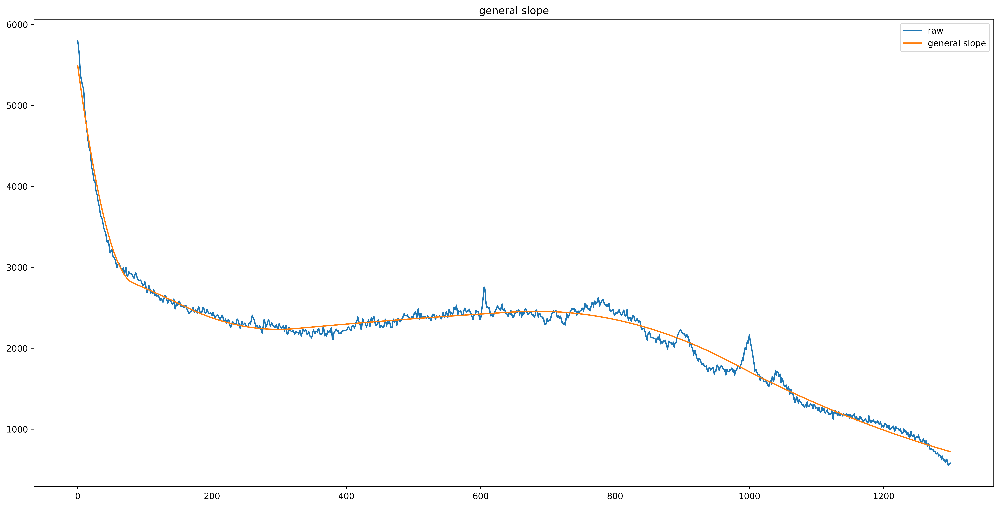

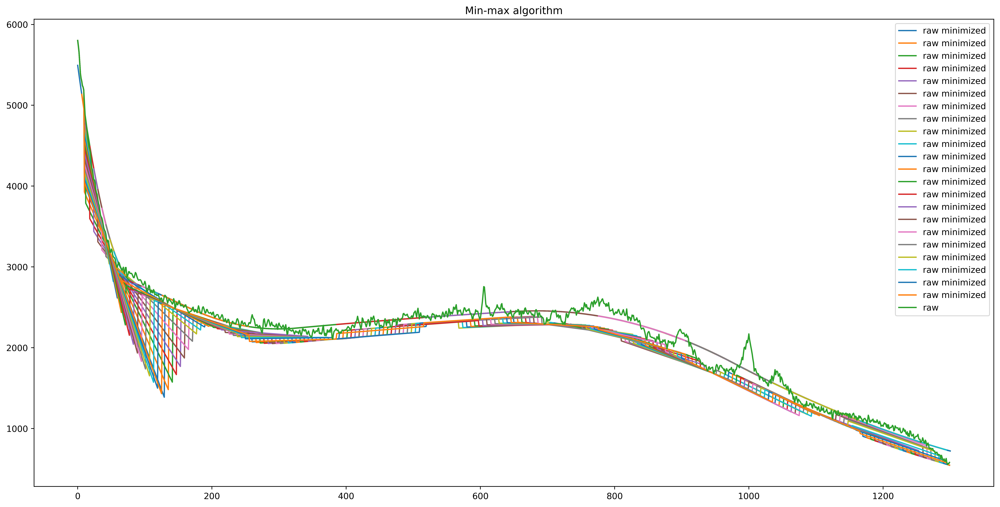

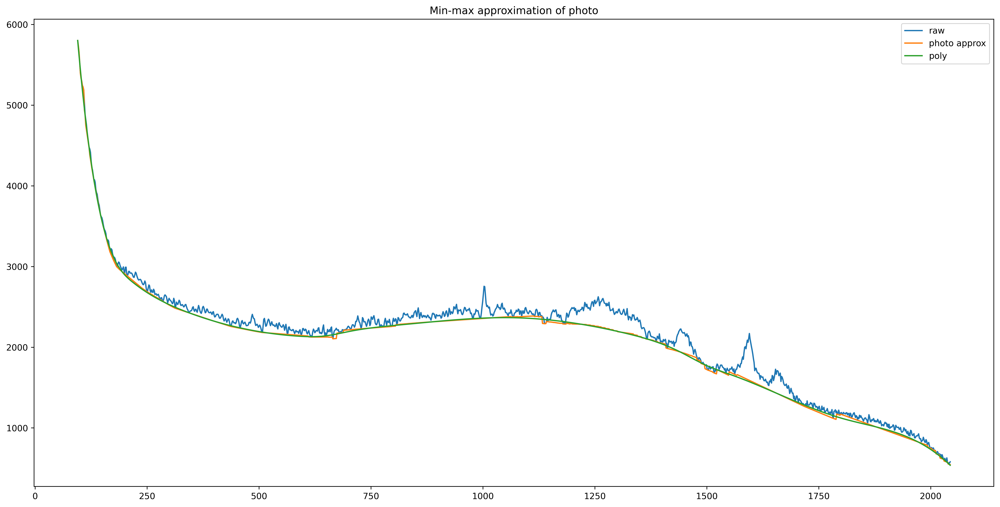

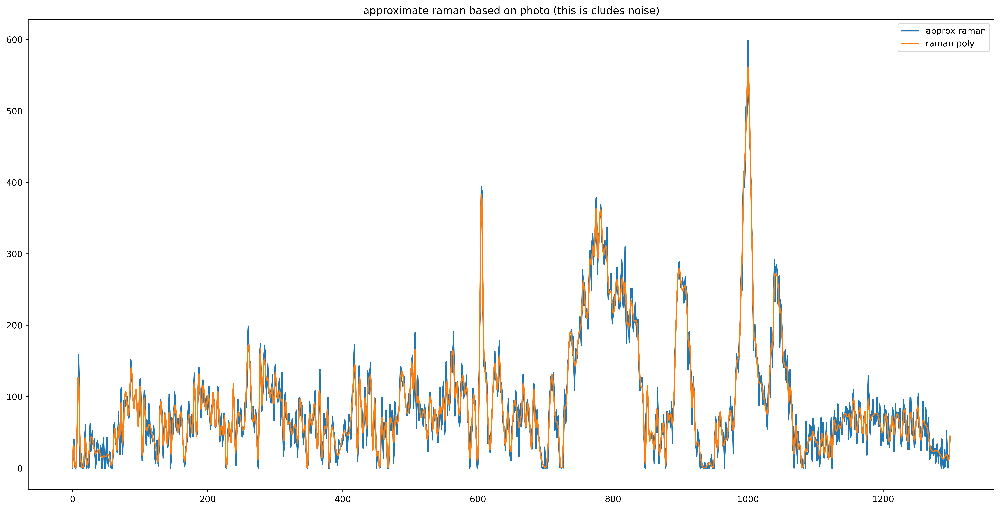

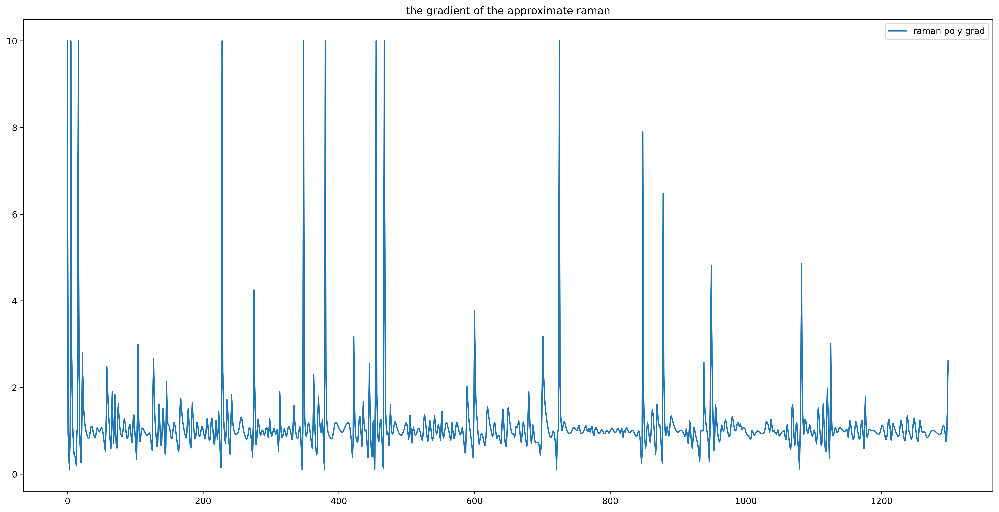

...

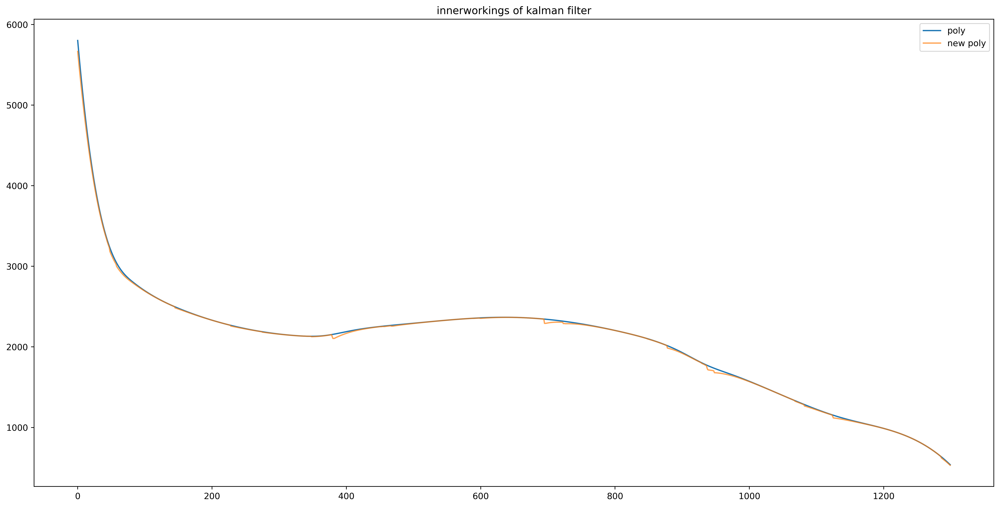

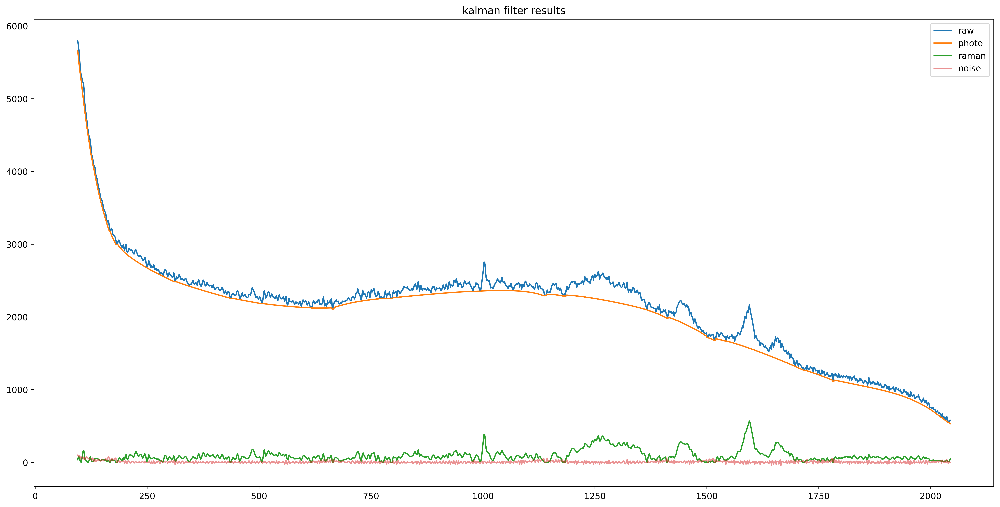

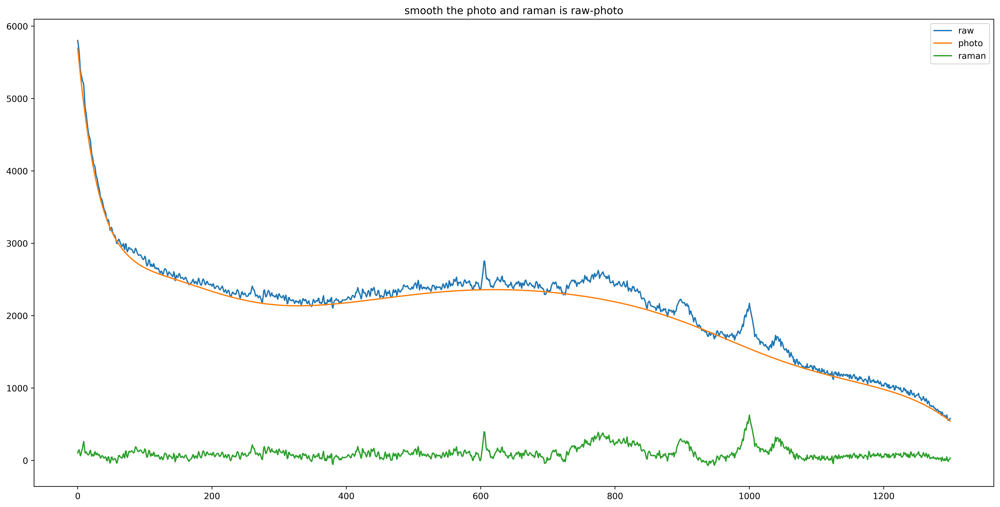

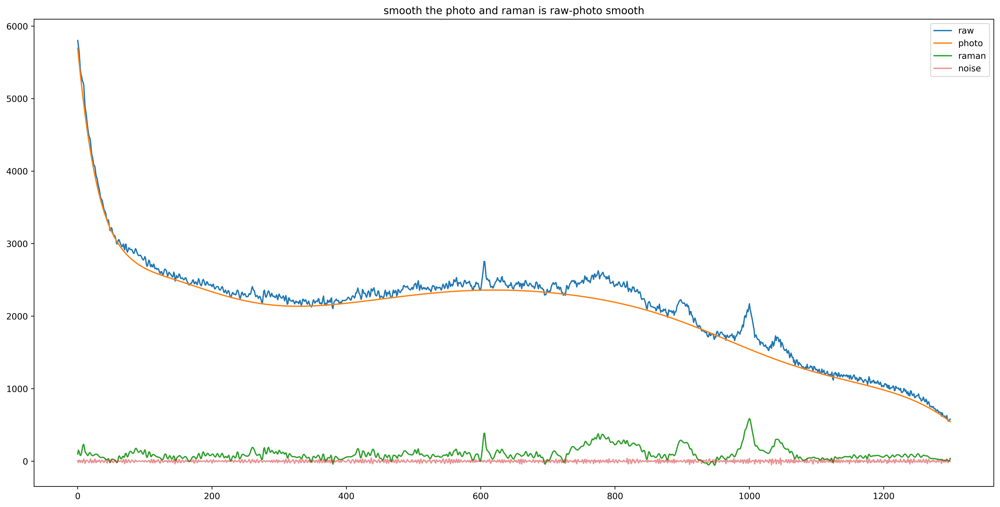

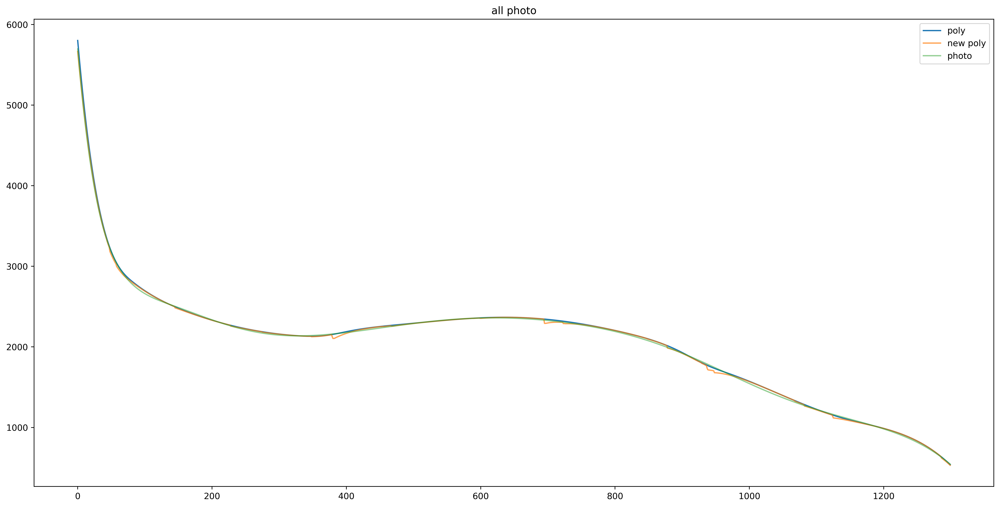

TypeError: cannot unpack non-iterable NoneType object

In [381]:
import timeit
from os import path

file_location2 = f"{'/'.join(file_location.split('/')[:-2])}/approximated/"
os.makedirs(file_location2, exist_ok=True)

shape = data[0][0].shape

for j, (f, img) in enumerate(zip(filenames, data)):   
    start = timeit.default_timer()
#     if path.exists(f'{file_location2}{f.split("/")[-1].split(".")[0]}_raman.npy'):
#         print(f'file already exist {file_location2}{f.split("/")[-1].split(".")[0]}_raman')
#         continue

    raman, photo = split_signal(img)

    stop = timeit.default_timer()
    print('Time: ', stop - start)  
    raman_grad
    np.save(f'{file_location2}{f.split("/")[-1].split(".")[0]}_raman', raman.reshape(shape))
    np.save(f'{file_location2}{f.split("/")[-1].split(".")[0]}_photoluminescence', photo.reshape(shape))
    print(f"image: {f} is done.")

In [ ]:
wavenumbers[200]